# Reimplementacion de CNN en Pytorch

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from zipfile import ZipFile
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.models as models
from torchvision.io import read_image
from sklearn.manifold import TSNE
import h5py
from torchvision.models import ResNet50_Weights
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from imageio.v2 import imread

# ===============================================
# 1. Cargar y preparar las imágenes
# ===============================================

if not os.path.exists("images_resize"):
    print('Extracting image files...')
    with ZipFile('images_pascalVOC.zip') as zf:
        zf.extractall('.')

image_paths = ["images_resize/" + p for p in sorted(os.listdir("images_resize")) if p.endswith(".jpg")]

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(), 
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

def load_image(path):
    img = Image.open(path).convert('RGB')
    return transform(img).unsqueeze(0) 

# ===============================================
# 2. Cargar modelo ResNet50 preentrenado
# ===============================================

model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
model.eval()
print(model)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 


Top 5 predicciones:
convertible: 12.7655
sports car: 12.0382
car wheel: 9.0643
beach wagon: 8.8481
grille: 7.8986


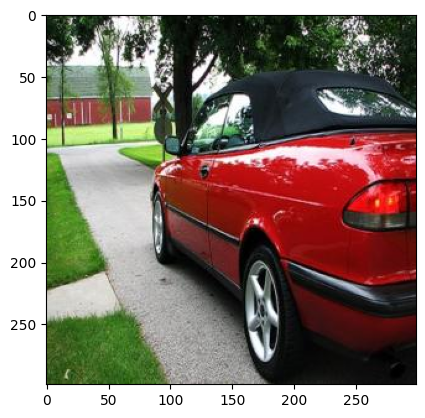

In [ ]:
# ===============================================
# 3. Predicción con clasificación completa (include_top=True)
# ===============================================


weights = ResNet50_Weights.IMAGENET1K_V1
preprocess = weights.transforms()

img_path = "images_resize/000007.jpg"
img = Image.open(img_path).convert("RGB")
img_pre = preprocess(img).unsqueeze(0)

with torch.no_grad():
    preds = model(img_pre)
    
class_names = weights.meta["categories"]
top5_idx = torch.topk(preds, 5).indices[0].tolist()

print("\nTop 5 predicciones:")
for i in top5_idx:
    print(f"{class_names[i]}: {preds[0, i].item():.4f}")

plt.imshow(img)
plt.show()

In [ ]:
# ===============================================
# 4. Representaciones intermedias (include_top=False)
# ===============================================

base_model = nn.Sequential(*list(model.children())[:-1])
base_model.eval()

def get_representation(img_tensor):
    with torch.no_grad():
        out = base_model(img_tensor)
    return out.squeeze().numpy()

rep = get_representation(img_pre)
print("Shape de la representación:", rep.shape)
print("Proporción de ceros:", np.mean(rep == 0.0))

Shape de la representación: (2048,)
Proporción de ceros: 0.00048828125


Proporción de ceros (primera imagen): 0.001953125
Proporción de valores negativos: 0.0


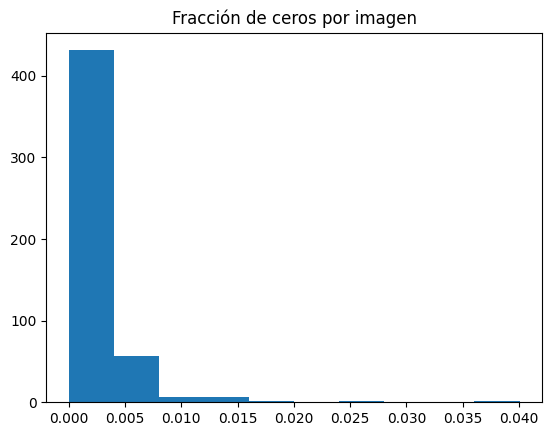

In [ ]:
# ===============================================
# 5. Extraer representaciones de todas las imágenes
# ===============================================

all_reps = []
for path in image_paths:
    img_tensor = load_image(path)
    rep = get_representation(img_tensor)
    all_reps.append(rep)

out_tensors = np.stack(all_reps)

with h5py.File('img_emb.h5', 'w') as h5f:
    h5f.create_dataset('img_emb', data=out_tensors)

print("Proporción de ceros (primera imagen):", np.mean(out_tensors[0] == 0))
print("Proporción de valores negativos:", np.mean(out_tensors < 0))

plt.hist(np.mean(out_tensors == 0.0, axis=1))
plt.title("Fracción de ceros por imagen")
plt.show()

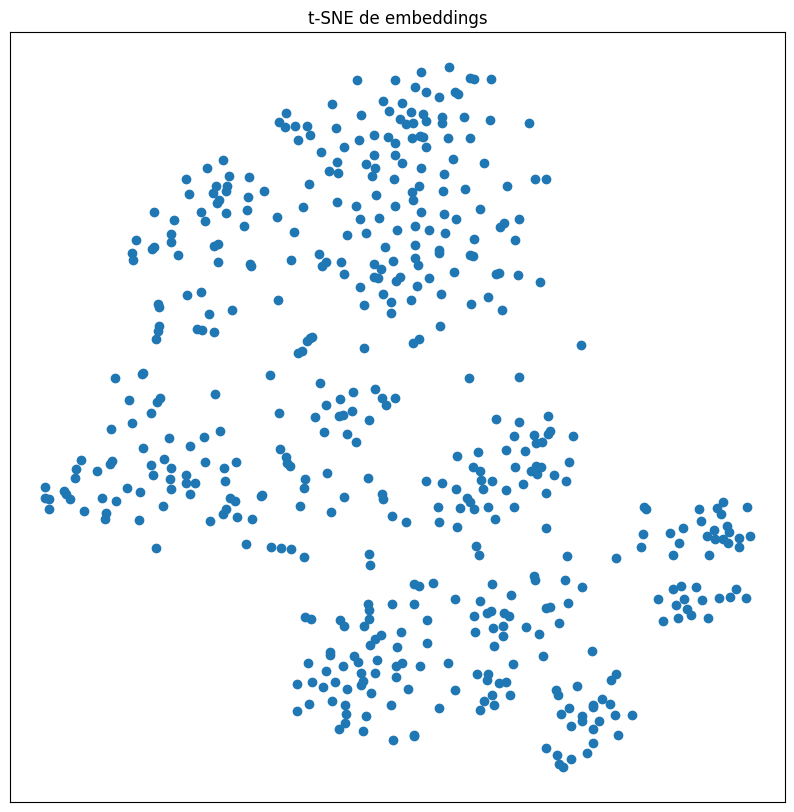

In [7]:
# ===============================================
# 6. t-SNE visualización
# ===============================================

img_emb_tsne = TSNE(perplexity=30, random_state=42).fit_transform(out_tensors)

plt.figure(figsize=(10, 10))
plt.scatter(img_emb_tsne[:, 0], img_emb_tsne[:, 1])
plt.title("t-SNE de embeddings")
plt.xticks([]); plt.yticks([])
plt.show()

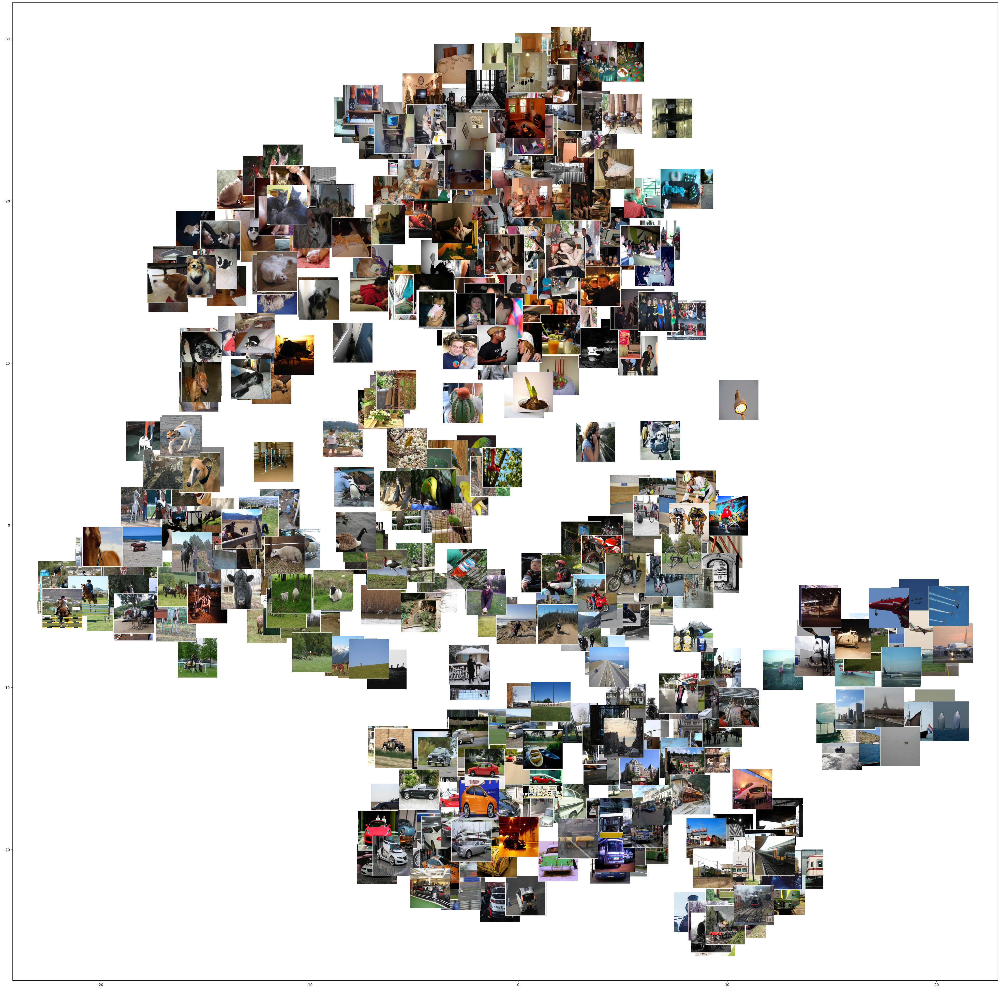

In [ ]:
# ===============================================
# 7. Mostrar imágenes en el mapa t-SNE
# ===============================================

def imscatter(x, y, paths, ax=None, zoom=1, linewidth=0):
    if ax is None:
        ax = plt.gca()
    artists = []
    for x0, y0, p in zip(x, y, paths):
        try:
            im = imread(p)
        except:
            continue
        im = Image.fromarray(im).resize((224, 224))
        im = OffsetImage(np.array(im), zoom=zoom)
        ab = AnnotationBbox(im, (x0, y0), xycoords='data',
                            frameon=True, pad=0.1, 
                            bboxprops=dict(edgecolor='red',
                                           linewidth=linewidth))
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()
    return artists

fig, ax = plt.subplots(figsize=(50, 50))
imscatter(img_emb_tsne[:, 0], img_emb_tsne[:, 1], image_paths, zoom=0.5, ax=ax)
plt.savefig('tsne_pytorch.png')

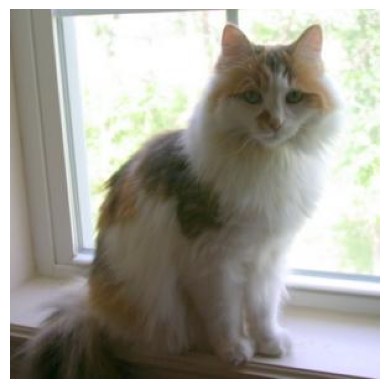

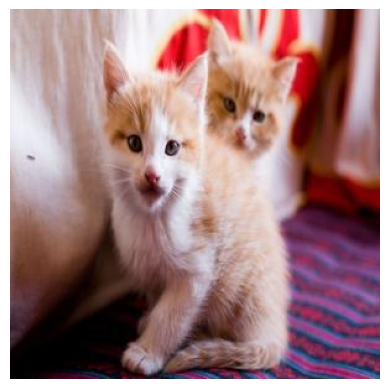

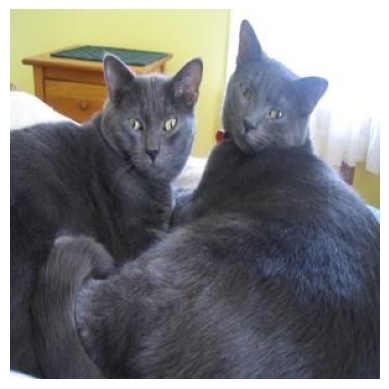

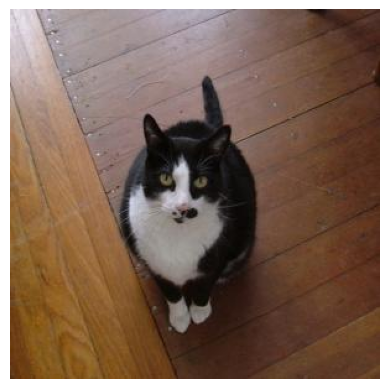

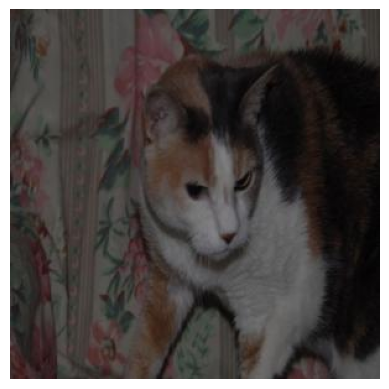

In [9]:
# ===============================================
# 8. Imágenes más similares
# ===============================================

def display(img_path):
    plt.figure()
    plt.imshow(Image.open(img_path))
    plt.axis('off')
    plt.show()

def most_similar(idx, top_n=5):
    dists = np.linalg.norm(out_tensors - out_tensors[idx], axis=1)
    sorted_idx = np.argsort(dists)
    return sorted_idx[:top_n]

idx = 57
sim = most_similar(idx)
for s in sim:
    display(image_paths[s])

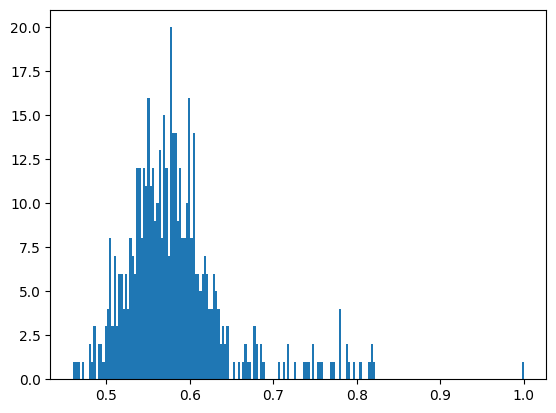

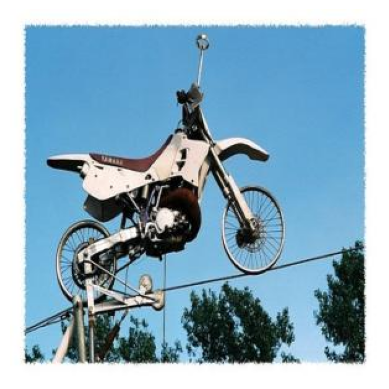

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 1

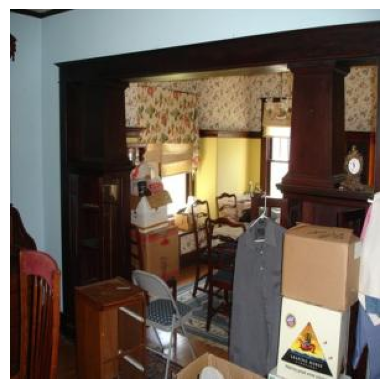

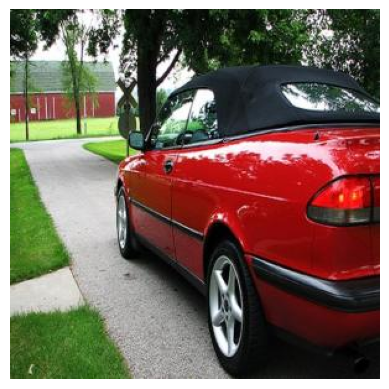

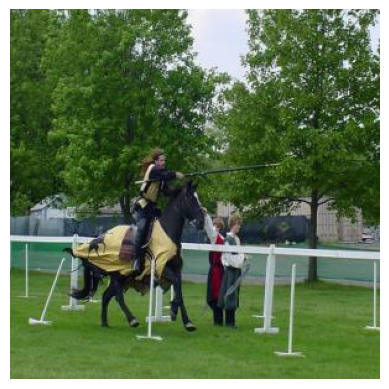

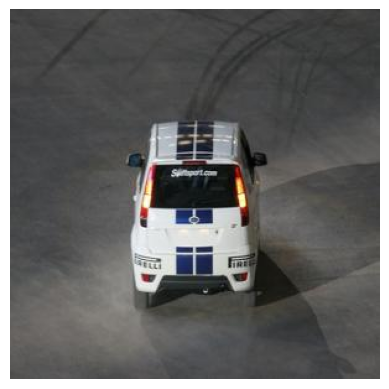

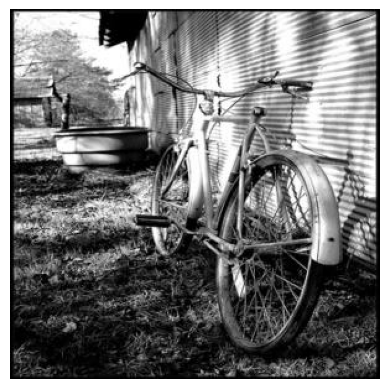

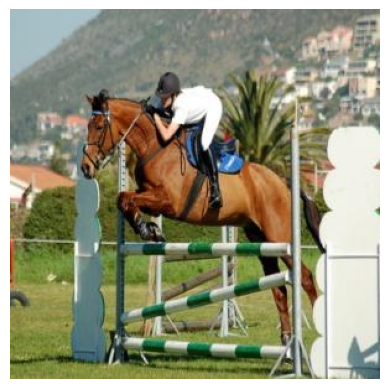

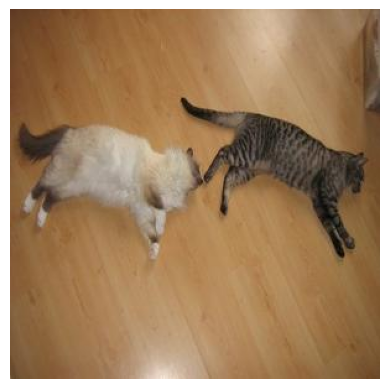

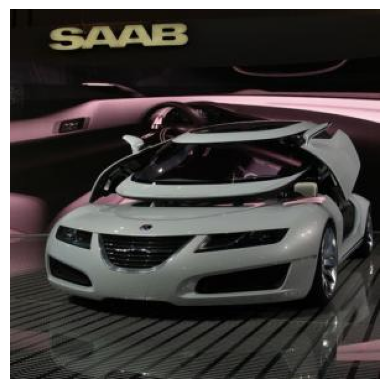

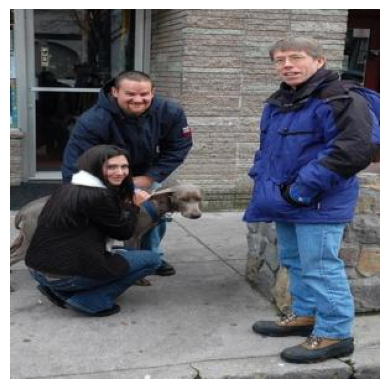

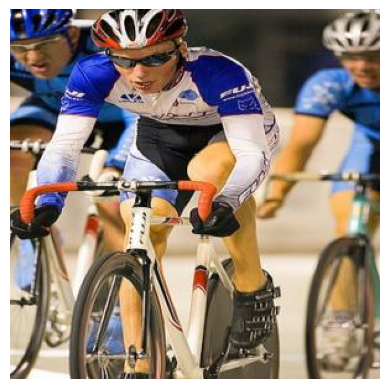

In [10]:
# ===============================================
# 9. Distancias y cosenos de similitud
# ===============================================

out_norms = np.linalg.norm(out_tensors, axis=1, keepdims=True)
normed_out_tensors = out_tensors / out_norms

item_idx = 208
cos_to_item = np.dot(normed_out_tensors, normed_out_tensors[item_idx])
plt.hist(cos_to_item, bins=200)
display(image_paths[item_idx])

items = np.where(cos_to_item > 0.44)
print(items)
for s in items[0][:10]:
    display(image_paths[s])